In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.ticker import MultipleLocator
import matplotlib.font_manager as font_manager
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

font = {'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : 9.2}
matplotlib.rc('font', **font)

sys.path.append(os.path.abspath('') + '/../..')

from utils.functions.gym import control_task_name

plt.rc('axes', labelsize=15)
plt.rc('axes', titlesize=15)

In [2]:
nb_params = {'acrobot' : 71, 'cart_pole' : 9, 'mountain_car' : 96, 'mountain_car_continuous' : 3, 'pendulum' : 322, 'bipedal_walker' : 144, 'bipedal_walker_hardcore' : 145, 'lunar_lander' : 128, 'lunar_lander_continuous' : 93, 'ant' : 265, 'half_cheetah' : 75, 'hopper' : 147, 'humanoid' : 242, 'humanoid_standup' : 186, 'inverted_double_pendulum' : 87, 'inverted_pendulum' : 52, 'reacher' : 75, 'swimmer' : 105, 'walker_2d' : 176}

In [3]:
def plot(list):

    fig, axs = plt.subplots(len(list),3, dpi=500)

    axs[0][0].set_title('Static Population')
    axs[0][1].set_title('Dynamic Population')
    axs[0][2].set_title('Final Architecture')
    axs[len(list)-1][0].set_xlabel('# Generations')
    axs[len(list)-1][1].set_xlabel('# Generations')

    for i in range( len(list) ):
        
        task, trials, pops, e_pops, nb_gens, ylims, yticks, leg, sota_leg, ymin, sota_dict = list[i]

        for j, loc in enumerate(['static', 'dynamic', 'pic']):
            
            if loc == 'pic':
                axs[i][j].set_xticks([])
                axs[i][j].set_yticks([])
                axs[i][j].set_xlabel(str(nb_params[task]) + ' parameters')
                path_0 = '../../data/states/envs.control.score/task.' + task + '~trials.' + str(trials) + '/bots.dynamic.rnn.control/'
                img = plt.imread(path_0 + str(pops[1][-1]) + '/' + str(nb_gens[1]) + '/net.png')
                axs[i][j].spines['top'].set_visible(False)
                axs[i][j].spines['right'].set_visible(False)
                axs[i][j].spines['bottom'].set_visible(False)
                axs[i][j].spines['left'].set_visible(False)
                axs[i][j].imshow(img)
                continue

            gens = [1]
            gens += np.arange(nb_gens[j]//50, nb_gens[j]+1, nb_gens[j]//50).tolist()
            path = '../../data/states/envs.control.score/task.' + task + '~trials.' + str(trials) + '/bots.' + loc + '.rnn.control/'

            scores = {}

            for pop in pops[j]:

                scores[pop] = np.zeros( len(gens) ) * np.nan
                scores[str(pop) + ' (elite)'] = np.zeros( len(gens) ) * np.nan

                for gen in gens:
                    if os.path.isfile(path + str(pop) + '/' + str(gen) + '/scores.npy'):
                        scores[pop][gens.index(gen)] = np.maximum(np.load(path + str(pop) + '/' + str(gen) + '/scores.npy').mean(), ymin)

                        if pop in e_pops[j]:
                            scores[str(pop) + ' (elite)'][gens.index(gen)] = np.maximum(np.load(path + str(pop) + '/' + str(gen) + '/scores.npy').mean(axis=1).max(), ymin)

            if j == 0:
                axs[i][j].set_ylabel(control_task_name(task)[:-3])
            if j == 1:
                axs[i][j].set_ylabel("Mean Score")

            if nb_gens[j] >= 1000:
                xticks = 1000
            else:
                xticks = 100

            axs[i][j].set_xticks(np.arange(0, nb_gens[j]+1, step=xticks))
            axs[i][j].set_yticks(np.arange(yticks[0], yticks[1]+1, step=yticks[2]))
            axs[i][j].set_xlim([-nb_gens[j]//50+(xticks>=1000),nb_gens[j]+nb_gens[j]//50-(xticks>=1000)])
            axs[i][j].set_ylim([ylims[0],ylims[1]])

            if j == 1:
                axs[i][j].set_yticks([])

            sorted_sota_dict = {k: v for k, v in sorted(sota_dict.items(), key=lambda item: item[1])}
            sota = []

            for key in sorted_sota_dict:

                if 'a2c' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='olivedrab', label=key))
                elif 'ddpg' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='lime', label=key))
                elif 'dqn' in key and 'qrdqn' not in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='red', label=key))
                elif 'ppo' in key and 'tppo' not in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='peru', label=key))
                elif 'qrdqn' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='darkorange', label=key))
                elif 'sac' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='darkviolet', label=key))
                elif 'td3' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='pink', label=key))
                elif 'tqc' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='seagreen', label=key))
                elif 'tppo' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='brown', label=key))
                elif 'gac' in key:
                    sota.append(axs[i][j].hlines(sorted_sota_dict[key], -nb_gens[j]//100, nb_gens[j]+nb_gens[j]//100, linestyles='dotted', colors='gold', label=key))
            sota.reverse()

            ne = []
            if 8 in pops[j]:
                ne.append(axs[i][j].plot(gens, scores[8], '.-', c='gainsboro', label='8')[0])
            if 16 in pops[j]:
                ne.append(axs[i][j].plot(gens, scores[16], '.-', c='lightgrey', label='16')[0])
            if 32 in pops[j]:
                ne.append(axs[i][j].plot(gens, scores[32], '.-', c='silver', label='32')[0])
            if 64 in pops[j]:
                ne.append(axs[i][j].plot(gens, scores[64], '.-', c='darkgrey', label='64')[0])
            if 128 in pops[j]:
                ne.append(axs[i][j].plot(gens, scores[128], '.-', c='grey', label='128')[0])
            if 256 in pops[j]:
                ne.append(axs[i][j].plot(gens, scores[256], '.-', c='dimgrey', label='256')[0])
            if 512 in pops[j]:
                ne.append(axs[i][j].plot(gens, scores[512], '.-', c='black', label='512')[0])

            if 16 in e_pops[j]:
                ne.append(axs[i][j].plot(gens, scores['16 (elite)'], '.-', c='lightblue', label='16 (elite)')[0])
            if 32 in e_pops[j]:
                ne.append(axs[i][j].plot(gens, scores['32 (elite)'], '.-', c='cornflowerblue', label='32 (elite)')[0])
            if 64 in e_pops[j]:
                ne.append(axs[i][j].plot(gens, scores['64 (elite)'], '.-', c='royalblue', label='64 (elite)')[0])
            if 128 in e_pops[j]:
                ne.append(axs[i][j].plot(gens, scores['128 (elite)'], '.-', c='blue', label='128 (elite)')[0])
            if 256 in e_pops[j]:
                ne.append(axs[i][j].plot(gens, scores['256 (elite)'], '.-', c='mediumblue', label='256 (elite)')[0])
            if 512 in e_pops[j]:
                ne.append(axs[i][j].plot(gens, scores['512 (elite)'], '.-', c='darkblue', label='512 (elite)')[0])

            ne.reverse()

            if loc == 'static':
                leg1 = axs[i][j].legend(handles=ne, title="Population size", loc=leg, edgecolor='palegoldenrod', labelspacing=0)
                leg1.get_frame().set_alpha(None)
                leg1.get_frame().set_facecolor((1, 1, 1, .45))
                axs[i][j].add_artist(leg1)

            if loc == 'dynamic':

                font = font_manager.FontProperties(family='monospace')

                leg2 = axs[i][j].legend(handles=sota, loc=sota_leg, edgecolor='palegoldenrod', labelspacing=0, prop=font)
                leg2.get_frame().set_alpha(None)
                leg2.get_frame().set_facecolor((1, 1, 1, .45))

            axs[i][j].xaxis.set_minor_locator(MultipleLocator(100))

# Classical Control

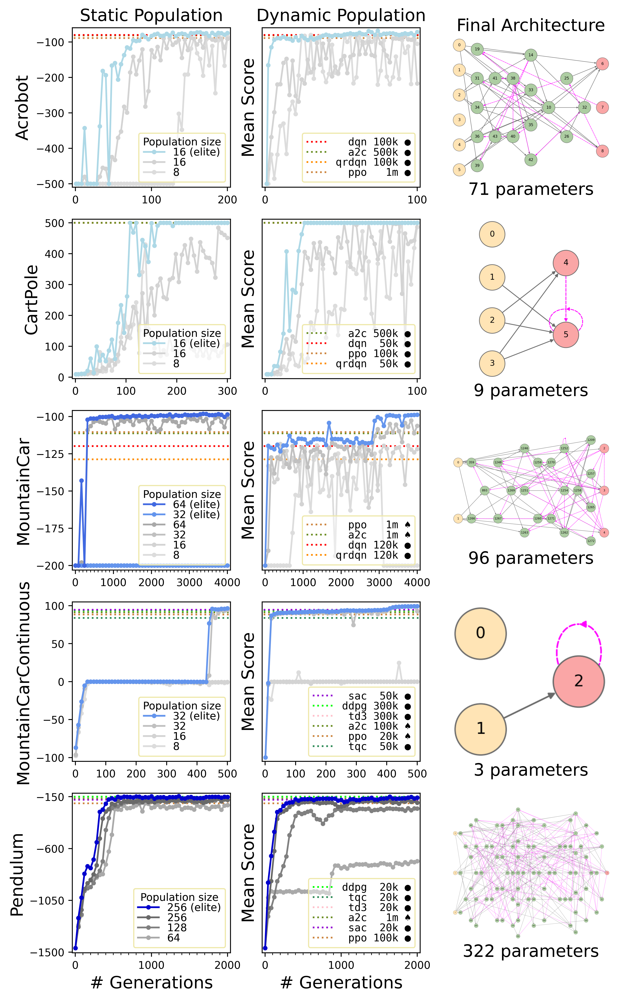

In [4]:
plt.rcParams["figure.figsize"] = [8.5, 15]
plot([['acrobot', 1, [[8,16],[8,16]], [[16],[16]], [200, 100], [-510, -60], [-500, -50, 100], 'lower right', 'lower right', -2**31-1, {'  a2c 500k ●':-81.0, '  dqn 100k ●':-80.4, '  ppo   1m ●':-89.0, 'qrdqn 100k ●':-81.5}],
      ['cart_pole', 1, [[8,16],[8,16]], [[16],[16]], [300,100], [-5, 512], [0, 500, 100], 'lower right', 'lower right', -2**31-1, {'qrdqn  50k ●':500.0, '  ppo 100k ●':500.0, '  dqn  50k ●':500.0, '  a2c 500k ●':500.0}],
      ['mountain_car', 1, [[8,16,32,64],[8,16,32]], [[32,64],[32]], [4000]*2, [-203, -96], [-200, -100, 25], 'lower right', 'lower right', -2**31-1, {'  a2c   1m ♠':-111.3, '  dqn 120k ●':-119.9, '  ppo   1m ♠':-110.4, 'qrdqn 120k ●':-128.7}],
      ['mountain_car_continuous', 1, [[8,16,32],[8,16,32]], [[32],[32]], [500]*2, [-105, 105], [-100, 100, 50], 'lower right', 'lower right', -2**31-1, {' a2c 100k ♠':91.2, 'ddpg 300k ●':93.5, ' ppo  20k ♠':88.3, ' sac  50k ●':94.6, ' td3 300k ●':93.4, ' tqc  50k ●':83.9}],
      ['pendulum', 5, [[64,128,256],[64,128,256]], [[256],[256]], [2000]*2, [-1505, -120], [-1500, -150, 450], 'lower right', 'lower right', -2**31-1, {' a2c   1m ♠':-163.0, 'ddpg  20k ●':-149.5, ' ppo 100k ●':-206.9, ' sac  20k ●':-176.7, ' td3  20k ●':-154.1, ' tqc  20k ●':-150.6}]])
plt.savefig("../../data/states/envs.control.score/classic.pdf")

# Box2D

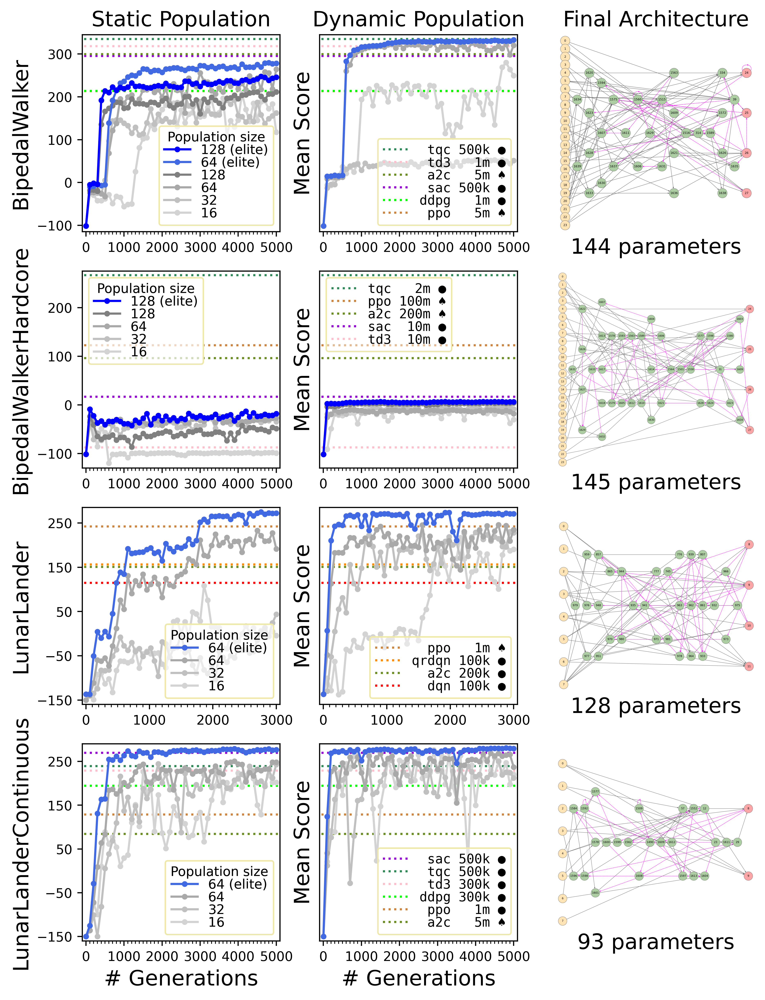

In [5]:
plt.rcParams["figure.figsize"] = [8.5,11.75]
plot([['bipedal_walker', 1, [[16,32,64,128],[16,32,64]], [[64, 128],[64]], [5000]*2, [-115, 345], [-100, 300, 100], 'lower right', 'lower right', -2**31-1, {' a2c   5m ♠':299.8, 'ddpg   1m ●':213.9, ' ppo   5m ♠':213.3, ' sac 500k ●':295.4, ' td3   1m ●':318.2, ' tqc 500k ●':335.0}],
      ['bipedal_walker_hardcore', 1, [[16,32,64,128],[16,32,64,128]], [[128],[128]], [5000]*2, [-130, 275], [-100, 300, 100], 'upper left', 'upper left', -2**31-1, {'a2c 200m ♠':96.2, 'ppo 100m ♠':122.4, 'sac  10m ●':16.9, 'td3  10m ●':-87.3, 'tqc   2m ●':266.5}],
      ['lunar_lander', 1, [[16,32,64],[16,32,64]], [[64],[64]], [3000]*2, [-160, 285], [-150, 250, 100], 'lower right', 'lower right', -150, {'  a2c 200k ●':150.8, '  dqn 100k ●':115.0, '  ppo   1m ♠':242.1, 'qrdqn 100k ●':156.4}],
      ['lunar_lander_continuous', 1, [[16,32,64],[16,32,64]], [[64],[64]], [5000]*2, [-160, 290], [-150, 250, 100], 'lower right', 'lower right', -150, {' a2c   5m ♠':84.2, 'ddpg 300k ●':194.4, ' ppo   1m ●':128.7, ' sac 500k ●':269.7, ' td3 300k ●':228.8, ' tqc 500k ●':239.1}]])
plt.savefig("../../data/states/envs.control.score/box2d.pdf")

# Mujoco 1

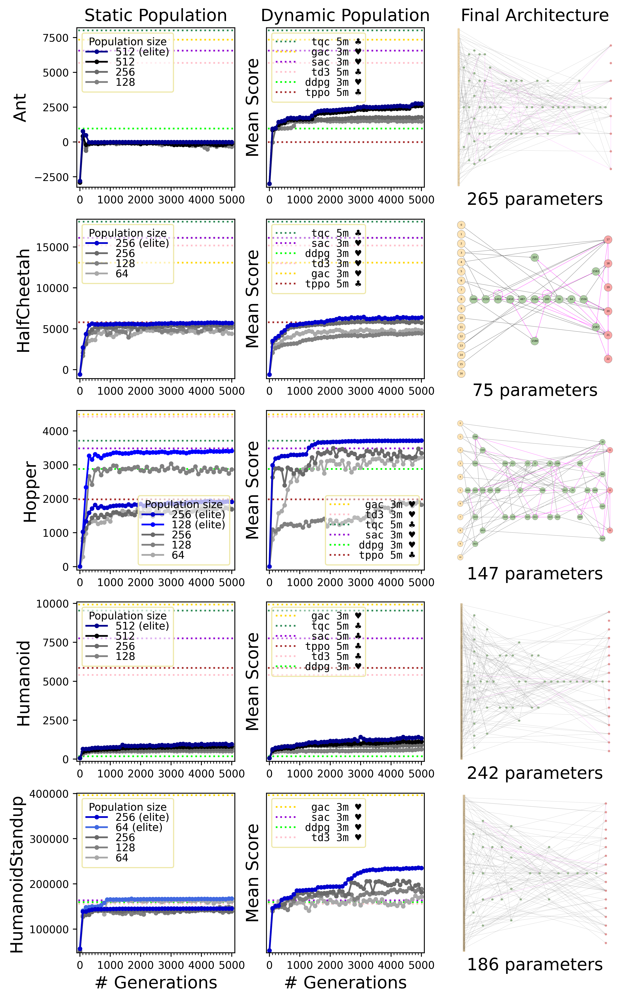

In [6]:
plt.rcParams["figure.figsize"] = [8.5, 15]
plot([['ant', 1, [[128,256,512],[128,256,512]], [[512],[512]], [5000]*2, [-3_250, 8_200], [-2_500, 7_500, 2_500], 'upper left', 'upper left', -2**31-1, {'ddpg 3m ♥':968, ' sac 3m ♥':6_555, ' td3 5m ♣':5_680, ' tqc 5m ♣':8_010, 'tppo 5m ♣':-10, ' gac 3m ♥':7_344}],
      ['half_cheetah', 1, [[64,128,256],[64,128,256]], [[256],[256]], [5000]*2, [-1_100, 18_400], [0, 15_000, 5_000], 'upper left', 'upper left', -2**31-1, {'ddpg 3m ♥':16_115, ' sac 3m ♥':16_120, ' td3 3m ♥':15_179, ' tqc 5m ♣':18_090, 'tppo 5m ♣':5_780, ' gac 3m ♥':13_077}],
      ['hopper', 1, [[64,128,256],[64,128,256]], [[128, 256],[256]], [5000]*2, [-100, 4_600], [0, 4_000, 1_000], 'lower right', 'lower right', -2**31-1, {'ddpg 3m ♥':2_879, ' sac 3m ♥':3_484, ' td3 3m ♥':4_417, ' tqc 5m ♣':3_710, 'tppo 5m ♣':1_980, ' gac 3m ♥':4_484}],
      ['humanoid', 1, [[128,256,512],[128,256,512]], [[512],[512]], [5000]*2, [-150, 10_100], [0, 10_001, 2_500], 'upper left', 'upper left', -2**31-1, {'ddpg 3m ♥':173, ' sac 5m ♣':7_760, ' td3 5m ♣':5_400, ' tqc 5m ♣':9_540, 'tppo 5m ♣':5_860, ' gac 3m ♥':9_929}],
      ['humanoid_standup', 1, [[64,128,256],[64,128,256]], [[64, 256],[256]], [5000]*2, [47_750, 400_500], [100_000, 400_000, 100_000], 'upper left', 'upper left', -2**31-1, {'ddpg 3m ♥':159_679, ' sac 3m ♥':163_716, ' td3 3m ♥':155_971, ' gac 3m ♥':396_109}]])
plt.savefig("../../data/states/envs.control.score/mujoco_1.pdf")

# Mujoco 2

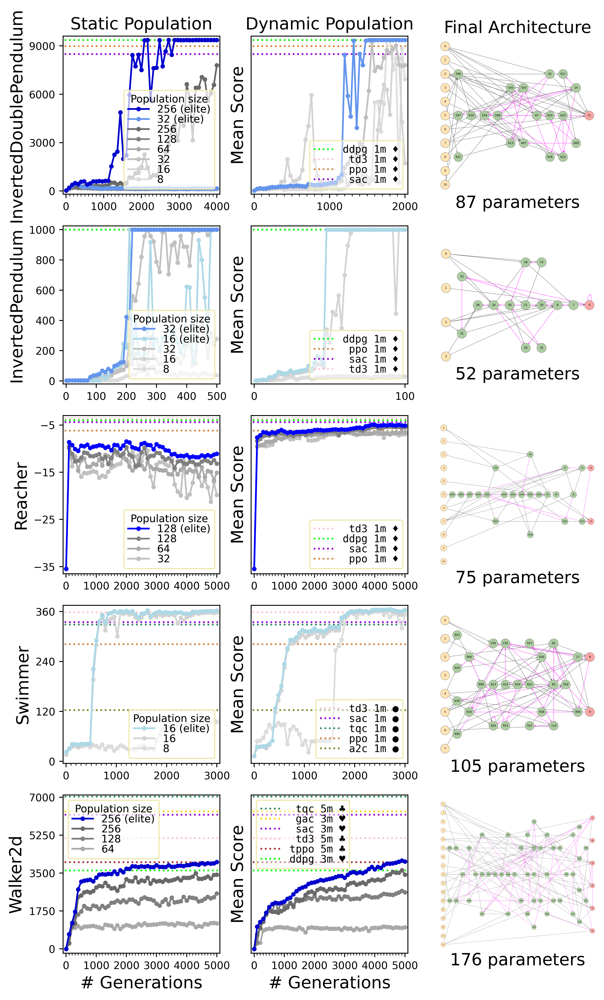

In [7]:
plt.rcParams["figure.figsize"] = [8.5, 15]
plot([['inverted_double_pendulum', 1, [[8,16,32,64,128,256],[8,16,32]], [[32,256],[32]], [4000,2000], [-200, 9600], [0, 9001, 3000], 'lower right', 'lower right', -2**31-1, {'ddpg 1m ♦':9_355.5, ' ppo 1m ♦':8_977.9, ' sac 1m ♦':8_487.2, ' td3 1m ♦':9_337.5}],
      ['inverted_pendulum', 1, [[8,16,32],[8,16]], [[16,32],[16]], [500,100], [-20, 1025], [0, 1001, 200], 'lower right', 'lower right', -2**31-1, {' td3 1m ♦':1_000, ' sac 1m ♦':1_000, ' ppo 1m ♦':1_000, 'ddpg 1m ♦':1_000}],
      ['reacher', 5, [[32,64,128],[32,64,128]], [[128],[128]], [5000]*2, [-36.5, -3], [-35, 5.1, 10], 'lower right', 'lower right', -35.5, {'ddpg 1m ♦':-4.0, ' ppo 1m ♦':-6.2, ' sac 1m ♦':-4.4, ' td3 1m ♦':-3.6}],
      ['swimmer', 1, [[8,16],[8,16]], [[16],[16]], [3000]*2, [-5, 375], [0, 361, 120], 'lower right', 'lower right', -2**31-1, {'a2c 1m ●':122.9, 'ppo 1m ●':281.6, 'sac 1m ●':334.6, 'td3 1m ●':358.3, 'tqc 1m ●':328.7}],
      ['walker_2d', 1, [[64,128,256],[64,128,256]], [[256],[256]], [5000]*2, [-200, 7100], [0, 7000, 1750], 'upper left', 'upper left', -2**31-1, {'ddpg 3m ♥':3_621, ' sac 3m ♥':6_187, ' td3 5m ♣':5_110, ' tqc 5m ♣':7_030, 'tppo 5m ♣':4_000, ' gac 3m ♥':6_348}]])
plt.savefig("../../data/states/envs.control.score/mujoco_2.pdf")